
# Autoencoders for Sustainable Building Design — In‑Class Lab (Colab)

**Learning goals**  
- Understand what an autoencoder is and how it can be used for **dimensionality reduction** and **denoising**.  
- Apply an autoencoder to a **building design dataset** (UCI Energy Efficiency) and visualize the **2D latent space**.  
- Build a simple **denoising convolutional autoencoder** on **synthetic thermal maps** (building‑inspired) and visualize before/after images.  
- Interpret **reconstruction error** and discuss how latent features can help downstream tasks (e.g., predicting heating/cooling loads).


In [ ]:

# If running locally (not in Colab), you might need:
# !pip install -q tensorflow pandas matplotlib scikit-learn openpyxl
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

print("TensorFlow:", tf.__version__)


TensorFlow: 2.19.0



## 2) Building dataset: UCI Energy Efficiency

We’ll use the **UCI Energy Efficiency** dataset (2012) with 8 building design variables and two targets:
- **Y1**: Heating Load (kWh/m²)
- **Y2**: Cooling Load (kWh/m²)

**Design variables (features)** include Relative Compactness, Surface Area, Wall Area, Roof Area, Overall Height, Orientation, Glazing Area, and Glazing Area Distribution.

We’ll train an **autoencoder on the 8 design variables**, compress to a 2‑D latent space, and visualize patterns vs. heating/cooling loads.


In [ ]:

# Download directly from UCI (Excel)
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00242/ENB2012_data.xlsx"
df = pd.read_excel(url)

# The UCI sheet has weird trailing spaces in column names; clean them:
df.columns = [c.strip() for c in df.columns]

# Rename to simpler shorter names (common convention for this dataset)
rename_map = {
    'X1': 'relative_compactness',
    'X2': 'surface_area',
    'X3': 'wall_area',
    'X4': 'roof_area',
    'X5': 'overall_height',
    'X6': 'orientation',
    'X7': 'glazing_area',
    'X8': 'glazing_area_distribution',
    'Y1': 'heating_load',
    'Y2': 'cooling_load'
}
df.rename(columns=rename_map, inplace=True, errors='ignore')

# Some versions already have readable names; ensure we keep only 8 features + 2 targets
feature_cols = ['relative_compactness','surface_area','wall_area','roof_area',
                'overall_height','orientation','glazing_area','glazing_area_distribution']
target_cols = ['heating_load','cooling_load']

# If not found, fall back to X1..X8,Y1,Y2
if not set(feature_cols).issubset(df.columns):
    feature_cols = ['X1','X2','X3','X4','X5','X6','X7','X8']
if not set(target_cols).issubset(df.columns):
    target_cols = ['Y1','Y2']

X = df[feature_cols].values.astype("float32")
Y = df[target_cols].values.astype("float32")

print("Data shape:", X.shape, Y.shape)
df.head()


Data shape: (768, 8) (768, 2)


,relative_compactness,surface_area,wall_area,roof_area,overall_height,orientation,glazing_area,glazing_area_distribution,heating_load,cooling_load
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28



### Train/Validation/Test split + Standardization


In [ ]:

X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.3, random_state=42)
X_val, X_test, Y_val, Y_test     = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)

scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_val_s   = scaler.transform(X_val)
X_test_s  = scaler.transform(X_test)

X_train_s[:3]


array([[-1.3406253 ,  1.5241529 ,  1.1212637 ,  0.94613767, -0.97244644,
         0.45145363,  0.10492786, -1.201968  ],
       [-1.1495904 ,  1.2447162 ,  0.55906147,  0.94613767, -0.97244644,
         1.3560454 , -1.0145345 , -0.55391896],
       [ 1.3338659 , -1.2702142 , -0.00314079, -1.2414874 ,  1.0283343 ,
        -0.45313814,  0.10492786,  1.390228  ]], dtype=float32)


## 3) Fully‑Connected Autoencoder (2‑D bottleneck)

We compress 8 standardized features → 2‑D latent code → reconstruct 8 features.

**Why 2D?** So we can **plot** the latent space and color by heating (Y1) or cooling (Y2) load.


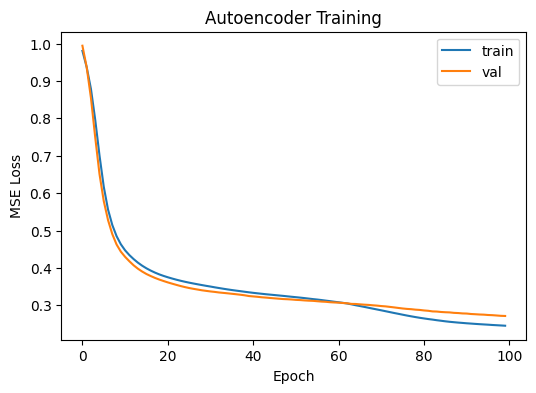

In [ ]:

tf.keras.utils.set_random_seed(7)

input_dim = X_train_s.shape[1]

encoder = keras.Sequential([
    layers.Input(shape=(input_dim,)),
    layers.Dense(16, activation='relu'),
    layers.Dense(8, activation='relu'),
    layers.Dense(2, name="latent")   # 2-D bottleneck
], name="encoder")

decoder = keras.Sequential([
    layers.Input(shape=(2,)),
    layers.Dense(8, activation='relu'),
    layers.Dense(16, activation='relu'),
    layers.Dense(input_dim, name="recon")
], name="decoder")

inputs = keras.Input(shape=(input_dim,))
z = encoder(inputs)
recon = decoder(z)
ae = keras.Model(inputs, recon, name="autoencoder")
ae.compile(optimizer=keras.optimizers.Adam(1e-3), loss="mse")

history = ae.fit(
    X_train_s, X_train_s,
    validation_data=(X_val_s, X_val_s),
    epochs=100, batch_size=32, verbose=0
)

# Plot training curve
plt.figure(figsize=(6,4))
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.xlabel('Epoch'); plt.ylabel('MSE Loss'); plt.title('Autoencoder Training')
plt.legend(); plt.show()



### Visualize the 2‑D latent space

We’ll color points by **heating load (Y1)** and **cooling load (Y2)** to see separability.


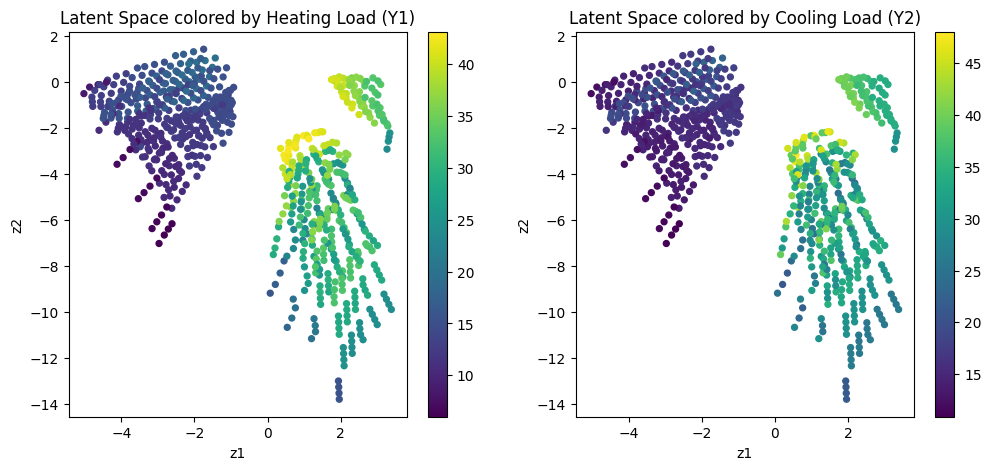

In [ ]:

# Get latent codes for all data
Z = encoder.predict(np.vstack([X_train_s, X_val_s, X_test_s]), verbose=0)
Y_all = np.vstack([Y_train, Y_val, Y_test])

fig, axes = plt.subplots(1, 2, figsize=(12,5))

sc1 = axes[0].scatter(Z[:,0], Z[:,1], c=Y_all[:,0], s=18)
axes[0].set_title("Latent Space colored by Heating Load (Y1)")
axes[0].set_xlabel("z1"); axes[0].set_ylabel("z2")
plt.colorbar(sc1, ax=axes[0])

sc2 = axes[1].scatter(Z[:,0], Z[:,1], c=Y_all[:,1], s=18)
axes[1].set_title("Latent Space colored by Cooling Load (Y2)")
axes[1].set_xlabel("z1"); axes[1].set_ylabel("z2")
plt.colorbar(sc2, ax=axes[1])

plt.show()



### Reconstruction error & example rows

Inspect how well the autoencoder reconstructs input features. Large errors may indicate outliers or regimes where the embedding is insufficient.


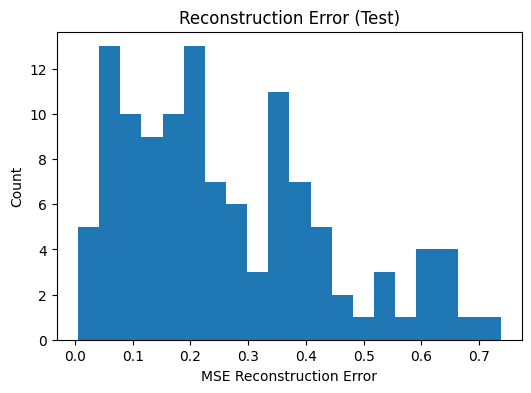

Lowest error indices: [72 47 38 87 10]
Highest error indices: [103  74 102  93   3]


,mse
3,0.737284
93,0.679247
102,0.656217
74,0.648879
103,0.648860
60,0.644596
24,0.604606
97,0.603234
112,0.597149
114,0.591794


In [ ]:

X_test_pred = ae.predict(X_test_s, verbose=0)
recon_err = np.mean((X_test_pred - X_test_s)**2, axis=1)

plt.figure(figsize=(6,4))
plt.hist(recon_err, bins=20)
plt.xlabel("MSE Reconstruction Error")
plt.ylabel("Count")
plt.title("Reconstruction Error (Test)")
plt.show()

# Show 5 rows with highest/lowest error
idx_sorted = np.argsort(recon_err)
print("Lowest error indices:", idx_sorted[:5])
print("Highest error indices:", idx_sorted[-5:])

pd.DataFrame({
    "mse": recon_err[idx_sorted[-10:]]
}, index=idx_sorted[-10:]).sort_values("mse", ascending=False).head(10)



### (Optional) Use latent codes for downstream prediction

We compare simple **Linear Regression** on:  
1) Original standardized features (8‑D)  
2) Concatenation of latent codes (2‑D) + original features (8‑D)  


In [ ]:

# Fit on train; evaluate on test
lin_full = LinearRegression().fit(X_train_s, Y_train[:,0])
mse_full = mean_squared_error(Y_test[:,0], lin_full.predict(X_test_s))

Z_train = encoder.predict(X_train_s, verbose=0)
Z_val   = encoder.predict(X_val_s, verbose=0)
Z_test  = encoder.predict(X_test_s, verbose=0)

XZ_train = np.hstack([X_train_s, Z_train])
XZ_test  = np.hstack([X_test_s, Z_test])

lin_lat = LinearRegression().fit(XZ_train, Y_train[:,0])
mse_lat = mean_squared_error(Y_test[:,0], lin_lat.predict(XZ_test))

print(f"MSE Heating Load — Linear on 8D: {mse_full:.4f}")
print(f"MSE Heating Load — Linear on 8D + 2D latent: {mse_lat:.4f}")


MSE Heating Load — Linear on 8D: 7.6940
MSE Heating Load — Linear on 8D + 2D latent: 6.9560



> ### ✅ Try it
> - Change the bottleneck size from **2 → 3 or 4** and re‑plot the latent space (use PCA to 2D for plotting).  
> - Add **Dropout** to the encoder and see the effect on reconstruction.  
> - Train a **denoising autoencoder** by adding Gaussian noise to inputs and using the clean inputs as targets.



## 4) Denoising Convolutional Autoencoder on Synthetic Thermal Maps (Building‑Inspired)

We’ll generate **synthetic 32×32 thermal maps** that mimic spatial temperature patterns across a floor (e.g., hot perimeter due to solar gains, cooler core). Then we’ll add noise and train a **Conv Autoencoder** to denoise.

This is illustrative, lightweight, and runs fast in class.


In [ ]:
def make_synthetic_thermal_map(n=32, hot_edge=True, seed=None):
    rng = np.random.default_rng(seed)
    base = rng.normal(loc=0.0, scale=0.1, size=(n, n))

    # Add a cool core and warmer perimeter to mimic perimeter loads
    y, x = np.indices((n, n))
    center = (n-1)/2
    r = np.sqrt((x-center)**2 + (y-center)**2)
    r = (r - r.min()) / (r.max() - r.min())  # 0 center -> 1 edges
    perimeter = r
    core = 1 - r

    field = 0.6*perimeter + 0.4*core + base

    # Add a couple of "rooms" with different setpoints (rectangles)
    for _ in range(rng.integers(2, 5)):
        x1, y1 = rng.integers(0, n//2, size=2)
        x2, y2 = x1 + rng.integers(n//8, n//3), y1 + rng.integers(n//8, n//3)
        x2, y2 = min(x2, n-1), min(y2, n-1)
        delta = rng.uniform(-0.4, 0.4)
        field[y1:y2, x1:x2] += delta

    # Normalize to [0,1] as "temperature-like" intensity
    field = (field - field.min()) / (field.max() - field.min())
    return field.astype("float32")

# Generate dataset
N = 2000
imgs = np.stack([make_synthetic_thermal_map(seed=i) for i in range(N)], axis=0)
imgs = imgs[..., np.newaxis]  # (N, 32, 32, 1)

# Add Gaussian noise for denoising task
noise_level = 0.25
noisy = imgs + noise_level * np.random.normal(size=imgs.shape).astype("float32")
noisy = np.clip(noisy, 0.0, 1.0)

Xtr, Xte = train_test_split(np.arange(N), test_size=0.2, random_state=42)
x_train, x_test = noisy[Xtr], noisy[Xte]
y_train, y_test = imgs[Xtr], imgs[Xte]

x_train.shape, x_test.shape


((1600, 32, 32, 1), (400, 32, 32, 1))

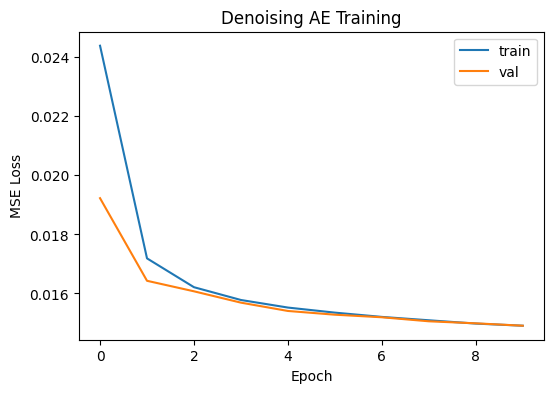

In [ ]:
# Build a small Conv Denoising Autoencoder
def build_conv_dae(input_shape=(32,32,1)):
    inp = keras.Input(shape=input_shape)
    # Encoder
    x = layers.Conv2D(16, 3, activation='relu', padding='same')(inp)
    x = layers.MaxPool2D()(x)
    x = layers.Conv2D(32, 3, activation='relu', padding='same')(x)
    x = layers.MaxPool2D()(x)
    # Bottleneck
    x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
    # Decoder
    x = layers.UpSampling2D()(x)
    x = layers.Conv2D(32, 3, activation='relu', padding='same')(x)
    x = layers.UpSampling2D()(x)
    x = layers.Conv2D(16, 3, activation='relu', padding='same')(x)
    out = layers.Conv2D(1, 3, activation='sigmoid', padding='same')(x)
    model = keras.Model(inp, out)
    model.compile(optimizer=keras.optimizers.Adam(1e-3), loss='mse')
    return model

dae = build_conv_dae()
hist = dae.fit(x_train, y_train, validation_data=(x_test, y_test),
               epochs=10, batch_size=64, verbose=0)

# Plot training curve
plt.figure(figsize=(6,4))
plt.plot(hist.history['loss'], label='train')
plt.plot(hist.history['val_loss'], label='val')
plt.xlabel('Epoch'); plt.ylabel('MSE Loss'); plt.title('Denoising AE Training')
plt.legend(); plt.show()

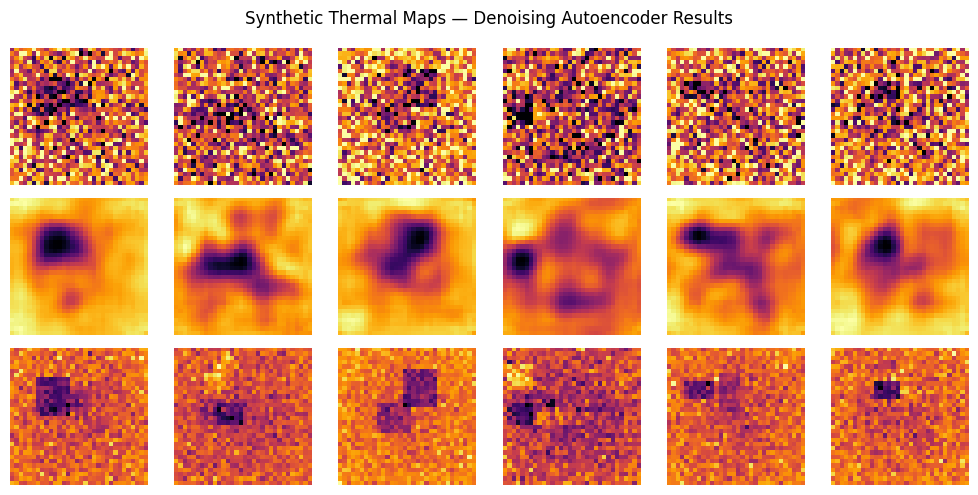

In [ ]:
# Visualize a few examples: noisy vs. denoised vs. clean
idxs = np.random.choice(len(x_test), size=6, replace=False)
pred = dae.predict(x_test[idxs], verbose=0)

n = len(idxs)
plt.figure(figsize=(10, 5))
for i in range(n):
    plt.subplot(3, n, i+1)
    plt.imshow(x_test[idxs[i]].squeeze(), cmap='inferno')
    plt.axis('off')
    if i == 0: plt.ylabel('Noisy')
    plt.subplot(3, n, n+i+1)
    plt.imshow(pred[i].squeeze(), cmap='inferno')
    plt.axis('off')
    if i == 0: plt.ylabel('Denoised')
    plt.subplot(3, n, 2*n+i+1)
    plt.imshow(y_test[idxs[i]].squeeze(), cmap='inferno')
    plt.axis('off')
    if i == 0: plt.ylabel('Clean')
plt.suptitle('Synthetic Thermal Maps — Denoising Autoencoder Results', y=0.98)
plt.tight_layout()
plt.show()



> ### ✅ Try it
> - Increase `noise_level` to **0.35–0.5** and re‑train. What happens to the denoised images?  
> - Make the network **deeper** or add **BatchNorm/Dropout**. Does validation loss improve?  
> - Replace rectangles with **corridor‑like** patterns or add a **hot strip** on one side to mimic solar gains by orientation.



## 5) Discussion

- **When to use autoencoders** in building workflows? (e.g., compressing multi‑parametric design spaces, anomaly detection on BMS streams, pretraining for energy‑load prediction)  
- **Latent space interpretability**: Do clusters correspond to specific design attributes (e.g., high glazing)?  
- **Denoising**: Can similar methods clean **thermal camera feeds** or **IoT sensor grids**?  
- **Limitations**: Black‑box behavior, overfitting, need for careful validation.


# pix2pix: Image-to-image translation with a conditional GAN

from Tensorflow Tutorial

This tutorial demonstrates how to build and train a conditional generative adversarial network (cGAN) called pix2pix that learns a mapping from input images to output images, as described in Image-to-image translation with conditional adversarial networks by Isola et al. (2017). pix2pix is not application specific—it can be applied to a wide range of tasks, including synthesizing photos from label maps, generating colorized photos from black and white images, turning Google Maps photos into aerial images, and even transforming sketches into photos.

In this example, your network will generate images of building facades using the CMP Facade Database provided by the Center for Machine Perception at the Czech Technical University in Prague. To keep it short, you will use a preprocessed copy of this dataset created by the pix2pix authors.

In the pix2pix cGAN, you condition on input images and generate corresponding output images. cGANs were first proposed in Conditional Generative Adversarial Nets (Mirza and Osindero, 2014)

The architecture of your network will contain:

A generator with a U-Net-based architecture.
A discriminator represented by a convolutional PatchGAN classifier (proposed in the pix2pix paper).
Note that each epoch can take around 15 seconds on a single V100 GPU.

In [ ]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

In [ ]:
dataset_name = "facades"

In [ ]:
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname=f"{dataset_name}.tar.gz",
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name

30168306/30168306 ━━━━━━━━━━━━━━━━━━━━ 12s 0us/step


In [ ]:
list(PATH.parent.iterdir())

[PosixPath('/root/.keras/datasets/facades_extracted'),
 PosixPath('/root/.keras/datasets/facades.tar.gz')]

In [ ]:
sample_image = tf.io.read_file(str(PATH.parent / 'facades_extracted' / dataset_name / 'train/13.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


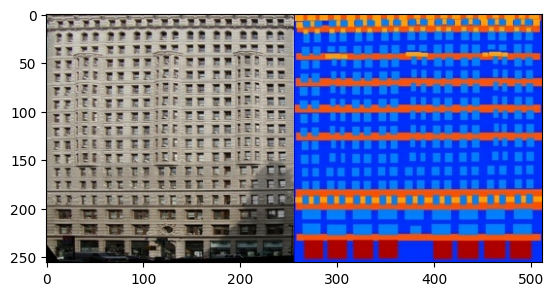

In [ ]:
plt.figure()
plt.imshow(sample_image)

In [ ]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

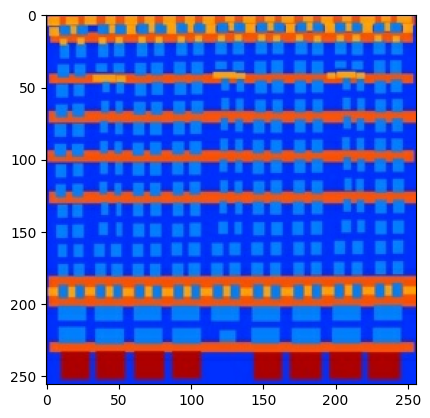

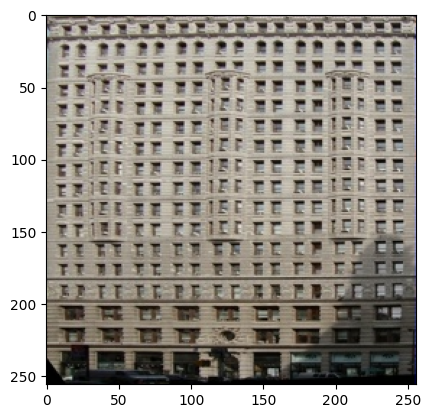

In [ ]:
inp, re = load(str(PATH.parent / 'facades_extracted' / dataset_name / 'train/13.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

As described in the pix2pix paper, you need to apply random jittering and mirroring to preprocess the training set.

Define several functions that:

Resize each 256 x 256 image to a larger height and width—286 x 286.

Randomly crop it back to 256 x 256.

Randomly flip the image horizontally i.e., left to right (random mirroring).

Normalize the images to the [-1, 1] range.

In [ ]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

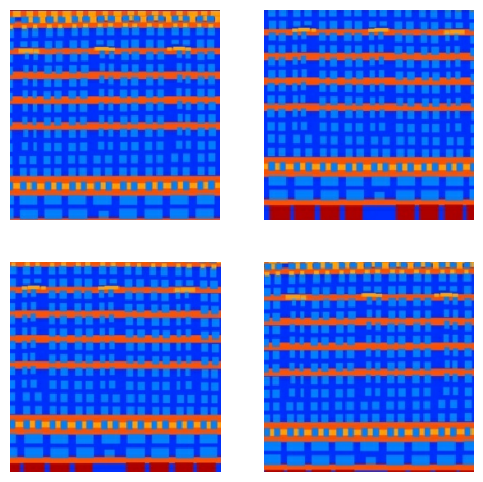

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
train_dataset = tf.data.Dataset.list_files(str(PATH.parent / 'facades_extracted' / dataset_name / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH.parent / 'facades_extracted' / dataset_name / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH.parent / 'facades_extracted' / dataset_name / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Build the generator
The generator of your pix2pix cGAN is a modified U-Net. A U-Net consists of an encoder (downsampler) and decoder (upsampler). (You can find out more about it in the Image segmentation tutorial and on the U-Net project website.)

Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU
There are skip connections between the encoder and decoder (as in the U-Net).
Define the downsampler (encoder):

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

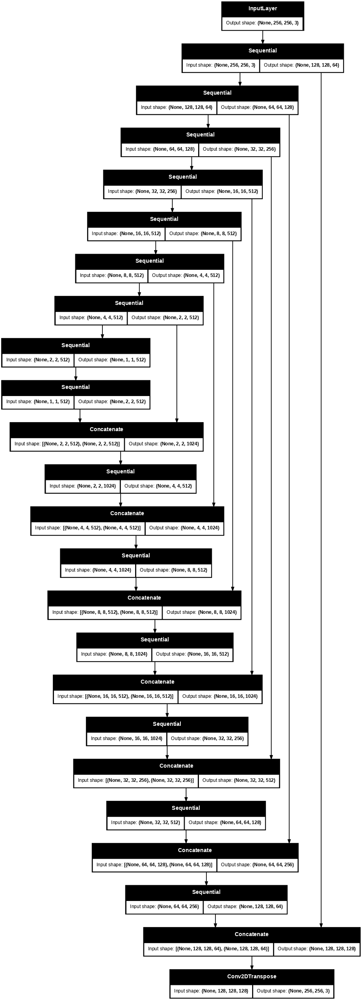

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

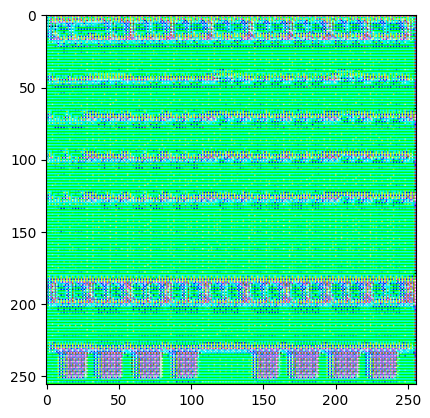

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

## Define the generator loss
GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the pix2pix paper.

The generator loss is a sigmoid cross-entropy loss of the generated images and an array of ones.
The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
This allows the generated image to become structurally similar to the target image.
The formula to calculate the total generator loss is gan_loss + LAMBDA * l1_loss, where LAMBDA = 100. This value was decided by the authors of the paper.

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

## Build the discriminator
The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image patch is real or not real, as described in the pix2pix paper.

Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
The shape of the output after the last layer is (batch_size, 30, 30, 1).
Each 30 x 30 image patch of the output classifies a 70 x 70 portion of the input image.
The discriminator receives 2 inputs:
The input image and the target image, which it should classify as real.
The input image and the generated image (the output of the generator), which it should classify as fake.
Use tf.concat([inp, tar], axis=-1) to concatenate these 2 inputs together.
Let's define the discriminator:

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

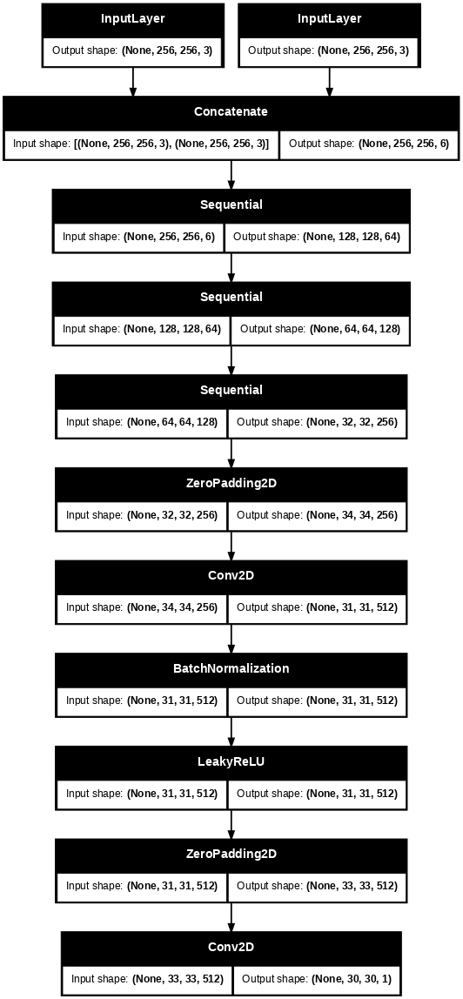

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

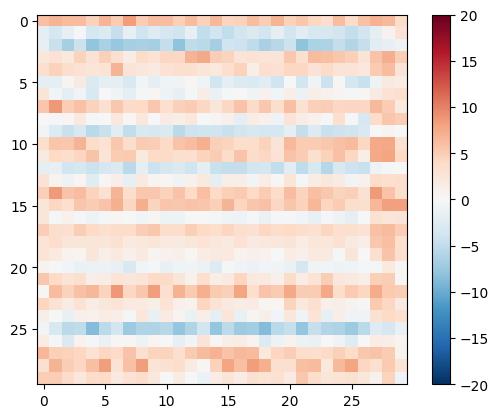

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

## Define the discriminator loss
The discriminator_loss function takes 2 inputs: real images and generated images.
real_loss is a sigmoid cross-entropy loss of the real images and an array of ones(since these are the real images).
generated_loss is a sigmoid cross-entropy loss of the generated images and an array of zeros (since these are the fake images).
The total_loss is the sum of real_loss and generated_loss.

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate images
Write a function to plot some images during training.

Pass images from the test set to the generator.
The generator will then translate the input image into the output.
The last step is to plot the predictions and voila!

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

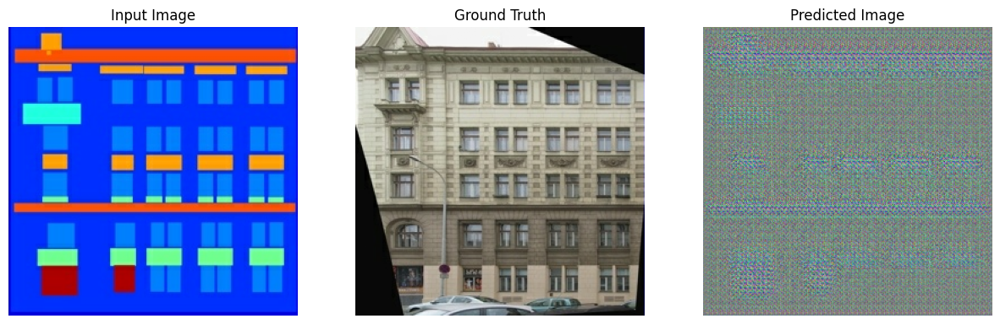

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

## Training
For each example input generates an output.
The discriminator receives the input_image and the generated image as the first input. The second input is the input_image and the target_image.
Next, calculate the generator and the discriminator loss.
Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
Finally, log the losses to TensorBoard.

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

Output hidden; open in https://colab.research.google.com to view.

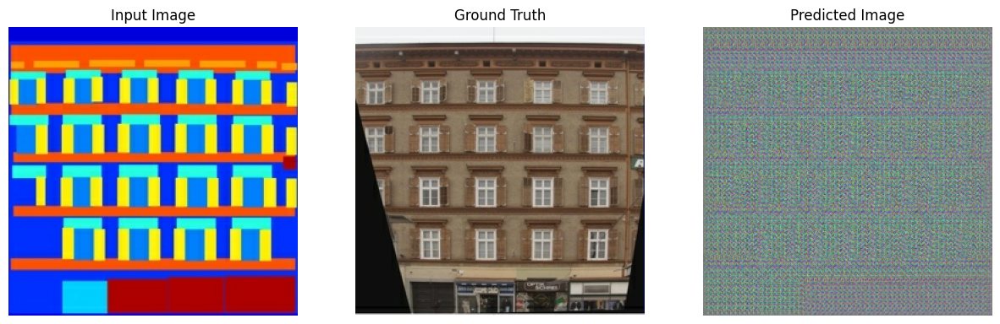

Step: 0k
.................

KeyboardInterrupt: 

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
ls {checkpoint_dir}

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

# Pix2Pix (AnimeGAN)

In [ ]:
# Setup: Import and load the face-paint model
import torch
from torchvision.transforms.functional import to_tensor, to_pil_image
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torch.hub.load("bryandlee/animegan2-pytorch:main",
                       "generator", pretrained="face_paint_512_v2", device=device)
model.eval()


Using cache found in /root/.cache/torch/hub/bryandlee_animegan2-pytorch_main


Generator(
  (block_a): Sequential(
    (0): ConvNormLReLU(
      (0): ReflectionPad2d((3, 3, 3, 3))
      (1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1), bias=False)
      (2): GroupNorm(1, 32, eps=1e-05, affine=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): ConvNormLReLU(
      (0): ReflectionPad2d((0, 1, 0, 1))
      (1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (2): GroupNorm(1, 64, eps=1e-05, affine=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): ConvNormLReLU(
      (0): ReflectionPad2d((1, 1, 1, 1))
      (1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (2): GroupNorm(1, 64, eps=1e-05, affine=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (block_b): Sequential(
    (0): ConvNormLReLU(
      (0): ReflectionPad2d((0, 1, 0, 1))
      (1): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (2): GroupNorm(1, 128, eps=1e-05, affi

Saving 12291082_10153371198209422_6484645400033712639_o.jpg to 12291082_10153371198209422_6484645400033712639_o (2).jpg


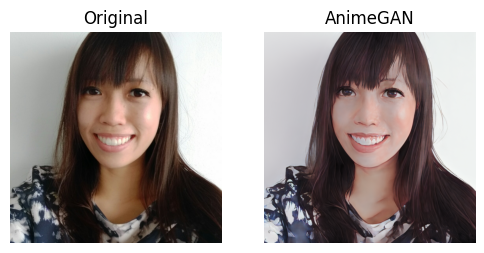

In [ ]:
# Upload a face image and run AnimeGANv2
from google.colab import files
import matplotlib.pyplot as plt

uploaded = files.upload()
img_path = list(uploaded.keys())[0]
orig = Image.open(img_path).convert("RGB")

# Prepare tensor and run the model
tensor = to_tensor(orig).unsqueeze(0) * 2 - 1
output = model(tensor.to(device)).cpu()[0]
stylized = to_pil_image((output * 0.5 + 0.5).clamp(0,1))

# Show original and stylized images
fig, axes = plt.subplots(1,2, figsize=(6,3))
axes[0].imshow(orig);      axes[0].axis('off'); axes[0].set_title('Original')
axes[1].imshow(stylized); axes[1].axis('off'); axes[1].set_title('AnimeGAN')
plt.show()


# ControlNet Stable Diffusion Model

In [ ]:
!pip install -q diffusers transformers accelerate

import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from PIL import Image
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt

# Load ControlNet (works!)
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-seg", torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


StableDiffusionControlNetPipeline {
  "_class_name": "StableDiffusionControlNetPipeline",
  "_diffusers_version": "0.35.2",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "controlnet": [
    "diffusers",
    "ControlNetModel"
  ],
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "UniPCMultistepScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [ ]:
# Upload a segmentation mask
from google.colab import files
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

control_image = Image.open(image_path).convert("RGB").resize((512, 512))

Saving Mask.png to Mask.png


  0%|          | 0/30 [00:00<?, ?it/s]

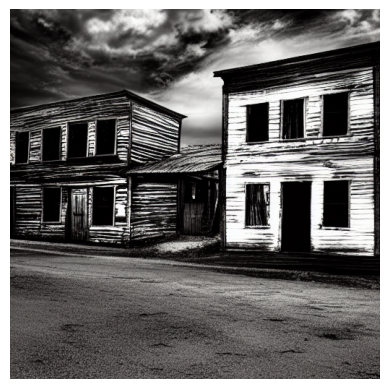

In [ ]:
# Run the model
output = pipe(
    prompt="ghost town style",
    image=control_image,
    control_image=control_image,
    num_inference_steps=30,
    guidance_scale=9.0
).images[0]

plt.imshow(output); plt.axis("off"); plt.show()